<a href="https://colab.research.google.com/github/Plogeur/BILL/blob/main/ProjetML2_2022_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<H1> Les jeux de données pour le projet </H1>

Dans ce notebook nous présentons les jeux de données utilisés pour le projet. Nous proposons également des fonctions pour permettre de pouvoir facilement les données.   

Il n'y a donc plus qu'à chercher les meilleurs modèles et à répondre aux questions de l'énoncé du projet.   

Bon courage !

ps : il y a trois jeux de données et ils sont très différents donc attention vous aurez peut être 3 modèles différents. 

# Installation



Avant de commencer, il est nécessaire de déjà posséder dans son environnement toutes les librairies utiles. Dans la seconde cellule nous importons toutes les librairies qui seront utiles à ce notebook. Il se peut que, lorsque vous lanciez l'éxecution de cette cellule, une soit absente. Dans ce cas il est nécessaire de l'installer. Pour cela dans la cellule suivante utiliser la commande :  

*! pip install nom_librairie*  

**Attention :** il est fortement conseillé lorsque l'une des librairies doit être installer de relancer le kernel de votre notebook.

**Remarque :** même si toutes les librairies sont importées dès le début, les librairies utiles pour des fonctions présentées au cours de ce notebook sont ré-importées de manière à indiquer d'où elles viennent et ainsi faciliter la réutilisation de la fonction dans un autre projet.



In [1]:
# utiliser cette cellule pour installer les librairies manquantes
# pour cela il suffit de taper dans cette cellule : !pip install nom_librairie_manquante
# d'exécuter la cellule et de relancer la cellule suivante pour voir si tout se passe bien
# recommencer tant que toutes les librairies ne sont pas installées ...

# sous Colab il faut déjà intégrer ces deux librairies

#!pip install umap-learn[plot]
#!pip install holoviews
#!pip install -U ipykernel
!pip install -U keras-tuner
# eventuellement ne pas oublier de relancer le kernel du notebook

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 135 kB 19.8 MB/s 
     |████████████████████████████████| 1.6 MB 57.1 MB/s 


In [2]:
# Importation des différentes librairies utiles pour le notebook
#librairy d'optimisation d'hyperametre 
import keras_tuner as kt

#indique des futurs warnings. 
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# librairies générales
import pickle
import pandas as pd
from scipy.stats import randint
import numpy as np
import string
import time
import base64
import re
import sys
import copy
import random
import shutil
from numpy import mean
from numpy import std

# librairie affichage
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.graph_objs as go
import plotly.offline as py

from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

# TensorFlow et keras
import tensorflow as tf
from keras import layers
from keras import models
from keras import optimizers
from keras import callbacks
from keras import backend as K
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Conv2DTranspose,Dense, Dropout, Flatten,BatchNormalization, SpatialDropout2D, GlobalAveragePooling2D

from keras.callbacks import Callback, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.applications.efficientnet_v2 import EfficientNetV2S
from keras.applications.efficientnet import EfficientNetB7

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.optimizers import SGD, RMSprop, Adadelta,Adam, Adamax
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import regularizers

from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras
from keras.models import Sequential
from keras.preprocessing import image
from tqdm import tqdm
from keras.models import load_model
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from keras.datasets import fashion_mnist
import os
from os import listdir
from os.path import isfile, join
import cv2
import glob

# librairies générales
from tabulate import tabulate
import time

# librairie affichage
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns

# librairies scikit learn
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.base import TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.metrics import plot_confusion_matrix

# librairies des classifiers utilisés
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

# librairies NLTK
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk import word_tokenize

from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from keras.layers import Reshape
from numpy.random import randn
from numpy.random import randint
from keras.layers import LeakyReLU
from skimage import color
from keras.layers import Concatenate

'''https://github.com/ionescuvlad97/rgb-images-generator-with-gan/blob/master/main.py'''
def convert_rgb2lab(images):
    return [color.rgb2lab(image) for image in images]

def convert_lab2rgb(images):
    return [color.lab2rgb(image) for image in images]

##Définition des constantes globale      


In [3]:
# constantes globales
IMG_SIZE = 128 # Taille de l'image
COLUMNS = 25 # Nombre d'images à afficher
EPOCHS = 100 # Nombre d'epoch
BATCH_SIZE = 15 # Pour le traitement par lot des images (optimisation de la dencité de gradient)
STOPPING_PATIENCE = 10 # Callback pour stopper si le modèle n'apprend plus
VERBOSE = 1 # Barre de chargement (0 : off, 1 : on, 2 : on mais moche)

##Drive et Création dossier

Pour pouvoir sauvegarder sur votre répertoire Google Drive, il est nécessaire de fournir une autorisation. Pour cela il suffit d'éxecuter la ligne suivante et de saisir le code donné par Google.

In [4]:
# pour monter son drive Google Drive local
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Corriger éventuellement la ligne ci-dessous pour mettre le chemin vers un répertoire spécifique dans votre répertoire Google Drive : 

In [5]:
import sys

my_local_drive='/content/gdrive/My Drive/'
# Ajout du path pour les librairies, fonctions et données
sys.path.append(my_local_drive)
# Se positionner sur le répertoire associé
%cd $my_local_drive

%mkdir Colab_Notebooks
%cd Colab_Notebooks
%mkdir HAI923
%cd HAI923

my_local_drive='/content/gdrive/My Drive/Colab_Notebooks/HAI923'

sys.path.append(my_local_drive)

%pwd

/content/gdrive/My Drive
mkdir: cannot create directory ‘Colab_Notebooks’: File exists
/content/gdrive/My Drive/Colab_Notebooks
mkdir: cannot create directory ‘HAI923’: File exists
/content/gdrive/My Drive/Colab_Notebooks/HAI923


'/content/gdrive/My Drive/Colab_Notebooks/HAI923'

##Fixation seed

Permet de rendre les résultats ramdomisé reproductible

In [6]:
from numpy.random import seed
SEED = 3
seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
tf.random.set_seed(SEED)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
K.set_session(sess)

#Les jeux de données


Récupération des jeux de données :      

In [7]:
if not(os.path.exists('Tiger-Fox-Elephant.zip')) :
  !wget https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip
if not(os.path.exists('Data_Project/Tiger-Fox-Elephant/')) :
  import zipfile
  with zipfile.ZipFile("Tiger-Fox-Elephant.zip","r") as zip_ref:
    zip_ref.extractall("Data_Project")


Il y a trois jeux de données différents : des tigres, des éléphants et des renards. Pour chacun d'entre eux il y a un ensemble d'images positive et un ensemble d'images négatives. Par exemple dans le répertoire *tiger* il n'y a que des images de tigre et dans le répertoire *Tiger_negative_class* il n'y a que des images d'animaux qui ne correspondent pas à des tigres.   

Le code ci-dessous permet de visualiser quelques images contenues dans le répertoire *tiger*. 

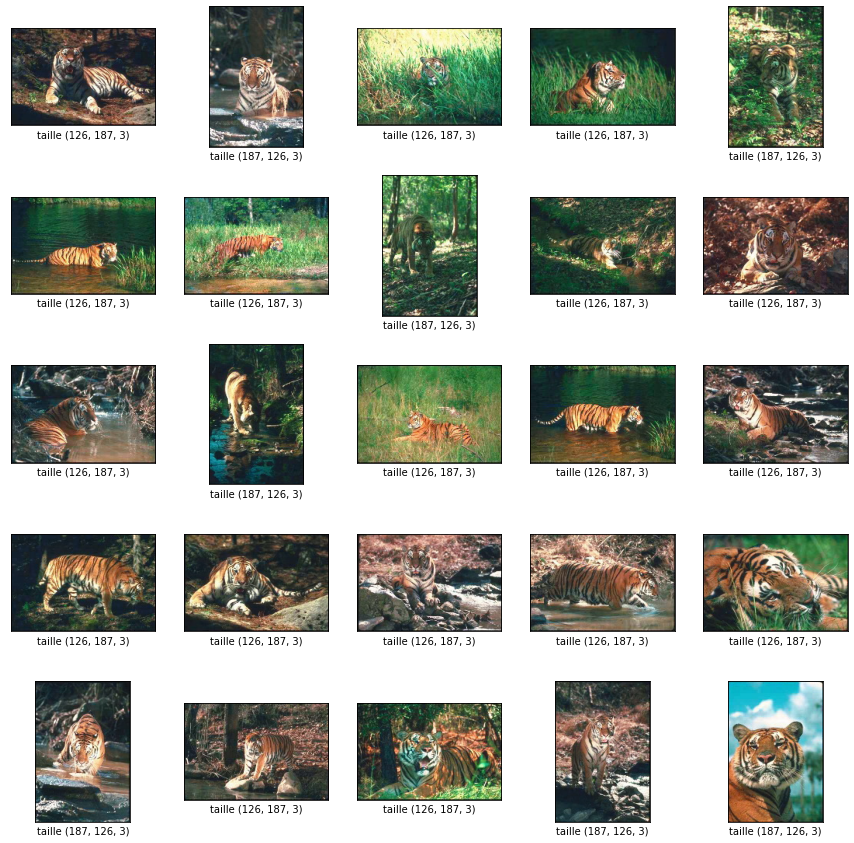

In [8]:
mypath='Data_Project/Tiger-Fox-Elephant/tiger'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
images = np.empty(len(onlyfiles), dtype=object)
for n in range(0, len(onlyfiles)):
  images[n] = cv2.imread(join(mypath,onlyfiles[n]))

COLUMNS = 25 # Nombre d'images à afficher

plt.figure(figsize=(15,15))
for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    # il faut donc convertir pour afficher les bonnes couleurs
    images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    plt.imshow(images[i],cmap=plt.cm.binary)  
    plt.xlabel('taille ' + str(images[i].shape))

Nous pouvons constater que les images ne sont pas de la même taille. Il faut donc les convertir. Une manière simple de faire et de faire la conversion lors de la lecture des images : ici nous convertissons toutes les images en 124x124.

**Créer le jeu de données**   

Actuellement pour chaque animal nous avons un répertoire qui contient des images positives et un répertoire qui contient des images négatives. Pour pouvoir créer un jeu de données nous devons obtenir X et y. Les fonctions ci-dessous permettent de générer, à partir des répertoires, un jeu de données aléatoire pour X et y.

In [9]:
def create_training_data(path_data, list_classes):
  training_data=[]
  for classes in list_classes:
      path=os.path.join(path_data, classes)
      class_num=list_classes.index(classes)
      for img in os.listdir(path):
        try :
          img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
          new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
          training_data.append([new_array, class_num])
        except Exception as e:
          pass  
  return training_data    

def create_X_y (path_data, list_classes):
      # récupération des données
      training_data=create_training_data(path_data, list_classes)
      # tri des données
      random.shuffle(training_data)
      # création de X et y
      X=[]
      y=[]
      for features, label in training_data:
        X.append(features)
        y.append(label)
      X=np.array(X).reshape(-1,IMG_SIZE, IMG_SIZE, 3)
      y=np.array(y)
      return X,y

def plot_examples(X,y):
  plt.figure(figsize=(15,15))
  for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    X[i] = cv2.cvtColor(X[i], cv2.COLOR_BGR2RGB)
    plt.imshow(X[i]/255.,cmap=plt.cm.binary)
    plt.xlabel('classe ' + str(y[i]))
  plt.show()

##Creation and Visualisation data

Pour les éléphants :     

In [10]:
def create_elephant() :
  my_path="Data_Project/Tiger-Fox-Elephant/"
  my_classes=['elephant','Elephant_negative_class']
  X,y=create_X_y(my_path,my_classes)
  print ("Nombre de données : ",X.shape[0])
  print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
  print ("Distribution des labels dans le jeu d'apprentissage")
  print("Nombres d'image de classe 0 : ", np.count_nonzero(y==0))
  print("Nombres d'image de classe 1 : ", np.count_nonzero(y==1))
  sns.countplot(np.array(y))
  plt.title("Nombre d'éléments par classe")
  # affichage
  plot_examples(X,y)

  # Surtout ne pas oublier de normaliser les données avec :
  X=X.astype('float')
  X=X/255.0
  return X,y

Pour les renards :     


In [11]:
def create_fox() : 
  my_path="Data_Project/Tiger-Fox-Elephant/"
  my_classes=['fox','Fox_negative_class']
  X,y=create_X_y (my_path,my_classes)
  print ("Nombre de données : ",X.shape[0])
  print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
  print ("Distribution des labels dans le jeu d'apprentissage")
  sns.countplot(np.array(y))
  plt.title("Nombre d'éléments par classe")
  # affichage
  plot_examples(X,y)

  # Surtout ne pas oublier de normaliser les données avec :
  X=X.astype('float')
  X=X/255.0
  return X,y 

Pour les tigres :

In [12]:
def create_tigre() :
  my_path="Data_Project/Tiger-Fox-Elephant/"
  my_classes=['tiger','Tiger_negative_class']
  X,y=create_X_y (my_path,my_classes)
  print ("Nombre de données : ",X.shape[0])
  print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
  print ("Distribution des labels dans le jeu d'apprentissage")
  sns.countplot(np.array(y))
  plt.title("Nombre d'éléments par classe")
  # affichage
  plot_examples(X,y)

  # Surtout ne pas oublier de normaliser les données avec :
  X=X.astype('float')
  X=X/255.0
  return X,y

#Fonctions

##Image generator (increase the number of picture)

L'augmentation d'image est une technique consistant à appliquer différentes transformations aux images originales, ce qui se traduit par plusieurs copies transformées de la même image. Chaque copie, cependant, est différente de l'autre à certains égards en fonction des techniques d'augmentation que vous appliquez comme le déplacement, la rotation, le retournement, etc.

In [13]:
def generatedData() :
  import glob
  if not(glob.glob('Data_Project/Tiger-Fox-Elephant/tiger/modify*.jpg')) :
    datagen = ImageDataGenerator(
            rotation_range=10,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.1,
            zoom_range=0.1,
            horizontal_flip=True,
            fill_mode='wrap')

    main_path="Data_Project/Tiger-Fox-Elephant/"

    #iterate over files in that directory
    for rep in os.listdir(main_path) :
      if rep == ".DS_Store" :
        continue
      for filename in os.listdir(main_path + rep) :
        f = os.path.join(main_path + rep, filename)
        img = load_img(f)  # this is a PIL image
        x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
        x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)
        i = 0

        for batch in datagen.flow(x, save_to_dir=main_path + rep, save_prefix='modify', batch_size=1, save_format='jpg') :
          i += 1
          if i > 15 :
            break  # otherwise the generator would loop indefinitely

##Slip dataset : train, test, validation 

Répartition du jeux de données en 3 dataset : 
- Train (entrainement du modèle)
- Val (évaluation du modèle)
- Test (test du modèle) 

In [14]:
def split(X,y) : 
  X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=SEED)
  return X_train, y_train, X_val, y_val

##Callbacks Keras (optimisation training step et éviter overfitting) 

EARLY_STOPPING : Permet de réduire prématurément l'entrainement du modèle lorsque celui-çi n'apprend plus (en comparant l'évolution drd val_loss précédent).
LR_REDUCTION : Permet de réduire le taux d'apprentissage (/2) lorsque la val accurancy stagne.

In [15]:
# Permet de stopper l'apprentissage si il stagne
EARLY_STOPPING = \
        EarlyStopping(
            monitor='val_loss',
            patience=STOPPING_PATIENCE,
            verbose=VERBOSE,
            mode='auto')

# Reduit le LearningRate si stagnation
LR_REDUCTION = \
        ReduceLROnPlateau(
            monitor='val_accuracy',
            patience=10,
            verbose=VERBOSE,
            factor=0.5,
            min_lr=0.0001)

CALLBACKS = [EARLY_STOPPING, LR_REDUCTION]

##Création des modèles

Baseline Model

In [16]:
def Baseline_model() :
  cnnmodel = Sequential()
  # 1 couche de convolution, avec nombre de filtres progressif 32
  cnnmodel.add(Conv2D(filters=32, kernel_size=(3,3), input_shape=(128, 128, 3), activation='relu'))
  cnnmodel.add(MaxPooling2D(pool_size=(2, 2)))
  # remise à plat
  cnnmodel.add(Flatten())
  # Couche dense classique ANN
  cnnmodel.add(Dense(85, activation='relu')) #Examiner les modifications effectuées à distance

  # Couche de sortie : classification => softmax sur le nombre de classe
  cnnmodel.add(Dense(units=1, activation='softmax'))

  opt = SGD(learning_rate=0.001)
  cnnmodel.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

  #Affichage du résumer
  cnnmodel.summary()
  return cnnmodel

In [17]:
def Baseline_model_hp(hp):
  cnnmodel = Sequential()
  # 1 couche de convolution, avec nombre de filtres progressif 32
  hp_filters = hp.Choice('num_filters', values=[32,64,98,128], default=32)
  cnnmodel.add(keras.layers.Conv2D(filters=hp_filters, kernel_size=(3,3),input_shape=(128, 128, 3), activation='relu'))
  cnnmodel.add(MaxPooling2D(pool_size=(2, 2)))
  
  # remise à plat
  cnnmodel.add(Flatten())
  # Couche dense classique ANN
  hp_units = hp.Int('units', min_value = 30, max_value = 200, step = 5)
  hp_activation_dense = hp.Choice( "dense_activation", values=["relu", "tanh"], default="relu")
  cnnmodel.add(keras.layers.Dense(units = hp_units, activation = hp_activation_dense))

  # Couche de sortie : classification => softmax sur le nombre de classe
  hp_activation_dense2 = hp.Choice( "dense_activation2", values=["relu", "tanh", "sigmoid", "softmax"], default="relu")
  cnnmodel.add(Dense(units=1, activation=hp_activation_dense2, name=hp_activation_dense2))

  hp_learning_rate = hp.Choice('learning_rate', values = [1e-2, 1e-3, 1e-4]) 
  cnnmodel.compile(optimizer = keras.optimizers.Adam(learning_rate = hp_learning_rate), loss = keras.losses.CategoricalCrossentropy(from_logits = True),  metrics = ['accuracy'])

  #Affichage du résumer
  cnnmodel.summary()

  return cnnmodel

  Advance model 


In [18]:
def Advanced_model() :
  model = Sequential()

  # Réalisation des couches de Convolution  / Pooling
  # ---- Conv / Pool N°1
  model.add(Conv2D(filters=64, kernel_size=3, strides=1, padding='same', input_shape=(128, 128, 3), activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # ---- Conv / Pool N°2
  model.add(Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # ---- Conv / Pool N°3
  model.add(Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # ---- Conv / Pool N°4
  model.add(Conv2D(filters=16, kernel_size=3, strides=1, padding='same', activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # Flattening : passage de matrices 3D vers un vecteur
  model.add(Flatten())
  model.add(Dense(900, activation='sigmoid'))

  # Couche de sortie : classification => softmax sur le nombre de classe
  model.add(Dense(units=1, activation='softmax', name='softmax'))

  # compilation du  model de classification
  opt = SGD(learning_rate=0.01)
  model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

  #Affichage du résumer
  model.summary()
  return model

In [19]:
from keras.engine.training import optimizer_v1
def Advanced_model_hp(hp) :
  model = Sequential()

  # Réalisation des couches de Convolution  / Pooling
  # ---- Conv / Pool N°1
  hp_filters1 = hp.Choice('num_filters1', values=[16,32,64,128], default=16)
  model.add(Conv2D(filters=hp_filters1, kernel_size=3, strides=1, padding='same', input_shape=(128, 128, 3), activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # ---- Conv / Pool N°2
  hp_filters2 = hp.Choice('num_filters2', values=[16,32,64,128], default=32)
  model.add(Conv2D(filters=hp_filters2, kernel_size=3, strides=1, padding='same', activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # ---- Conv / Pool N°3
  hp_filters3 = hp.Choice('num_filters3', values=[16,32,64,128], default=64)
  model.add(Conv2D(filters=hp_filters3, kernel_size=3, strides=1, padding='same', activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # ---- Conv / Pool N°4
  hp_filters4 = hp.Choice('num_filters4', values=[16,32,64,128], default=128)
  model.add(Conv2D(filters=hp_filters4, kernel_size=3, strides=1, padding='same', activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

  # Flattening : passage de matrices 3D vers un vecteur
  model.add(Flatten())
  hp_units = hp.Int('units', min_value = 128, max_value = 1024, step = 128)
  hp_activation_dense1 = hp.Choice("dense_activation1", values=["relu", "tanh", "sigmoid"], default="relu")
  model.add(Dense(hp_units, activation=hp_activation_dense1))
  
  # Couche de sortie : classification => softmax sur le nombre de classe
  hp_activation_dense2 = hp.Choice("dense_activation2", values=["relu", "tanh", "sigmoid", "softmax"], default="relu")
  model.add(Dense(units=1, activation=hp_activation_dense2))

  # compilation du  model de classification
  #hp_learning_rate = hp.Choice('learning_rate', values = [1e-2, 1e-3, 1e-4])
  optimizer_v1=hp.Choice("optimizer", values=["adam", "SGD", "RMSprop", "adadelta", "adamax", "softmax"], default="adam")
  model.compile(optimizer = optimizer_v1, loss = keras.losses.CategoricalCrossentropy(from_logits = True),  metrics = ['accuracy'])

  #Affichage du résumer
  model.summary()
  return model

TL model

In [20]:
def TLmodel() :
  #Création du modèle
  IMG_SHAPE = (128, 128, 3)
  resnet_model = Sequential()

  pretrained_model= tf.keras.applications.EfficientNetV2S(include_top=False, input_shape=IMG_SHAPE, pooling='avg',classes=2, weights='imagenet')

  #fixe les poids des neurones pour les neurones du modèle ResNet50
  for layer in pretrained_model.layers:
          layer.trainable=False

  resnet_model.add(pretrained_model)
  resnet_model.add(Flatten())
  resnet_model.add(Dense(736, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006), bias_regularizer=regularizers.l1(0.006) ,activation='relu'))
  resnet_model.add(Dense(1, activation='softmax'))

  resnet_model.compile(Adamax(learning_rate=.001), loss='categorical_crossentropy', metrics=['accuracy'])
  return resnet_model

In [21]:
def TLmodel2() :
  #Création du modèle
  IMG_SHAPE = (128, 128, 3)
  resnet_model = Sequential()

  pretrained_model= tf.keras.applications.EfficientNetV2S(include_top=False, input_shape=IMG_SHAPE, pooling='avg',classes=2, weights='imagenet')

  #fixe les poids des neurones pour les neurones du modèle ResNet50
  for layer in pretrained_model.layers:
          layer.trainable=False

  resnet_model.add(pretrained_model)
  resnet_model.add(GlobalAveragePooling2D())
  resnet_model.add(Dropout(rate=.2, seed=1))
  resnet_model.add(Dense(1, activation='softmax'))

  resnet_model.compile(Adamax(learning_rate=.001), loss='categorical_crossentropy', metrics=['accuracy'])
  resnet_model.summary()
  return resnet_model

In [22]:
def TLmodel3() :
  IMG_SHAPE = (128, 128, 3)
  pretrained_model = EfficientNetV2S(weights='imagenet', include_top=False, input_shape=IMG_SHAPE, classes=2)

  model = Sequential()
  model.add(pretrained_model)
  model.add(GlobalAveragePooling2D())
  model.add(Dropout(0.5))
  model.add(Dense(1, activation='softmax'))
  model.compile(Adamax(learning_rate=.001), loss='categorical_crossentropy', metrics=['accuracy'])

  model.summary()
  return model

In [23]:
def TLmodel_hp(hp) :
  #Création du modèle
  IMG_SHAPE = (128, 128, 3)
  resnet_model = Sequential()

  pretrained_model= tf.keras.applications.EfficientNetV2S(include_top=False, input_shape=IMG_SHAPE, pooling='avg',classes=2, weights='imagenet')

  #fixe les poids des neurones pour les neurones du modèle ResNet50
  for layer in pretrained_model.layers:
          layer.trainable=False

  resnet_model.add(pretrained_model)
  resnet_model.add(Flatten())
  hp_units = hp.Int('units', min_value = 32, max_value = 1024, step = 64)
  hp_activation_dense = hp.Choice( "dense_activation", values=["relu", "tanh", "sigmoid"], default="relu")
  resnet_model.add(keras.layers.Dense(units = hp_units, activation = hp_activation_dense))
  
  hp_dropout = hp.Float("dropout_1", min_value=0.1, max_value=0.6, default=0.4, step=0.05)
  resnet_model.add(Dropout(rate=hp_dropout))
  
  hp_activation_dense2 = hp.Choice( "dense_activation2", values=["relu", "tanh", "sigmoid","softmax"], default="relu")
  resnet_model.add(Dense(1, activation=hp_activation_dense2))

  hp_learning_rate = hp.Choice('learning_rate', values = [1e-2, 1e-3, 1e-4]) 
  resnet_model.compile(optimizer = keras.optimizers.Adam(learning_rate = hp_learning_rate), loss = keras.losses.CategoricalCrossentropy(from_logits = True),  metrics = ['accuracy'])
  return resnet_model

GAN générateur

In [24]:
def create_generator(latent_dim=100):
  size = int(IMG_SIZE/8)
  model = Sequential()
	# foundation for 4x4 image
  n_nodes = 256 * size * size
  model.add(Dense(n_nodes, input_dim=latent_dim))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Reshape((size, size, 256)))
  # upsample to 8x8
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  # upsample to 16x16
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  # upsample to 32x32
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  # output layer
  model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
  return model

In [25]:
def create_generator4(latent_dim=100) :
  epsilon = 0.00001 # Small float added to variance to avoid dividing by zero in the BatchNorm layers.
  noise_shape = (100,)
  size = int(IMG_SIZE/(32*2))
  model = Sequential()

  model.add(Dense(size*size*512*2, activation='linear', input_shape=noise_shape))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Reshape((size, size, 512*2)))

  model.add(Conv2DTranspose(512*2, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(256*2, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(128*2, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(64*2, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(64, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(32, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
  return model

GAN discriminateur

In [26]:
def create_discriminator():
  model = Sequential()
  # normal
  model.add(Conv2D(64, (3,3), padding='same', input_shape=[IMG_SIZE,IMG_SIZE,3]))
  model.add(LeakyReLU(alpha=0.2))
  # downsample
  model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  # downsample
  model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  # downsample
  model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  # classifier
  model.add(Flatten())
  model.add(Dropout(0.4))
  model.add(Dense(1, activation='sigmoid'))
  # compile model
  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [27]:
def create_discriminator4():
  model = Sequential()

  model.add(Conv2D(2*128, (3,3), padding='same', input_shape=[IMG_SIZE,IMG_SIZE,3]))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(MaxPooling2D(pool_size=(3,3)))
  model.add(Dropout(0.2))
  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(MaxPooling2D(pool_size=(3,3)))
  model.add(Dropout(0.3))
  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(MaxPooling2D(pool_size=(3,3)))
  model.add(Dropout(0.3))
  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(2*128, (3,3), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(MaxPooling2D(pool_size=(3,3)))
  model.add(Dropout(0.3))
    
  model.add(Flatten())
  model.add(Dense(2*128))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Dense(2*128))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dense(1, activation='sigmoid'))

  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

##Fonction et prétraitement GAN

In [28]:
# Chargement et normalisation des données
def load_data(animal):
  my_path="Data_Project/Tiger-Fox-Elephant/"
  my_classes=[animal]
  X,y=create_X_y(my_path,my_classes)
  # Surtout ne pas oublier de normaliser les données avec :
  X=X.astype('float32')
  #X=X/255.0
  X=(X - 127.5) / 127.5
  return X

# Creation d'un jeu de données de vraies images
# les vraies images sont labélisées avec 1
def generate_real_samples(dataset, nb_images):
  # tirage aléatoire
  ix = randint(0, dataset.shape[0], nb_images)
  #serie = random.sample(range(0, dataset.shape[0]), nb_images)
  # sélection des images
  X = dataset[ix]
  # mettre 1 comme label de classe
  y = ones((nb_images, 1))
  return X, y

# Création d'un faux jeu de données 
# elles seront labélisées avec 0
def generate_fake_samples(nb_images):
  X = np.random.rand(IMG_SIZE * IMG_SIZE * 3 * nb_images)
  # reshape en images grises
  X = X.reshape((nb_images, IMG_SIZE, IMG_SIZE, 3))
  # mettre 0 comme label de classe
  y = zeros((nb_images, 1))
  return X, y  

In [29]:
datagen = ImageDataGenerator(
			brightness_range = [0.35,0.70],
			horizontal_flip=True, 
			fill_mode='nearest', 
			featurewise_std_normalization=True)

/usr/local/lib/python3.8/dist-packages/keras/preprocessing/image.py:1297: UserWarning:

This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.



In [30]:
# train the discriminator model
def train_discriminator(model, dataset, epochs=100, batchsize=20):
  # on constitue un jeu de données de batchsize/2 images réelles et images fausses
	half_batch = int(batchsize / 2)
	# boucler sur les epochs
	for i in range(epochs):
		# sélection d'images réelles
		X_real, y_real = generate_real_samples(dataset, half_batch)
		# mettre à jour le discriminateur avec les images réelles
		_, real_acc = model.train_on_batch(X_real, y_real)
		# generation de fausses images 
		X_fake, y_fake = generate_fake_samples(half_batch)
		# mise à jour du discriminateur avec de fausses images 
		_, fake_acc = model.train_on_batch(X_fake, y_fake)
		# Affichage des résultats pour l'accuracy des vraies et des fausses
		print('>%d accuracy_real=%.0f%% accuracy_fake=%.0f%%' % (i+1, real_acc*100, fake_acc*100))

In [31]:
def create_gan(generator_model, discriminator_model):
  # mettre les poids du discriminateur non entrable
  discriminator_model.trainable = False
  # un seul modele qui regroupe 
  model = Sequential()
  # ajout du générateur
  model.add(generator_model)
  # ajout du discriminateur
  model.add(discriminator_model)

  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt)
  return model

In [32]:
def generate_latent_points(latent_dim, nb_images):
  X_input = np.random.randn(latent_dim * nb_images)
  X_input = X_input.reshape(nb_images, latent_dim)
  return X_input

def generate_fake_samples_for_generator(generator_model, latent_dim, nb_images):
  # generation des points 
  X_input = generate_latent_points (latent_dim,nb_images)
  # prediction de la sortie du générateur
  X = generator_model.predict(X_input)
  # A ce niveau on considère que les images sont fausses
  # donc on met 0 comme label. 
  y = zeros((nb_images, 1))
  return X, y    

def plot_and_save_generatedimages(generated_images, epoch, nb_images=10):
	# Affichage des images
	for i in range(nb_images * nb_images):
		pyplot.subplot(nb_images, nb_images, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(generated_images[i, :, :, 0], cmap='gray_r')
	# sauvegarde de l'image
	filename = 'generated_plot_FashionCNN_withGan%03d.png' % (epoch+1)
	pyplot.savefig(filename)
	pyplot.close()

def evaluate_model(dataset, epoch, generator_model, discriminator_model, latent_dim, nb_images=100, save_model=False):
  # récupération de vraies images pour le discriminateur
  X_real, y_real = generate_real_samples(dataset, nb_images)
  # Evaluation de l'accuracy pour le discriminateur
  _, acc_real = discriminator_model.evaluate(X_real, y_real, verbose=0)

  # génération de fausses images pour le générateur et donc le gan
  X_fake, y_fake = generate_fake_samples_for_generator(generator_model, latent_dim, nb_images)
  # Evaluation du discriminateur avec des fausses images
  _, acc_fake = discriminator_model.evaluate(X_fake, y_fake, verbose=0)
  print ('Accuracy reélle : %.0f%%, fausse : %.0f%%' % (acc_real*100, acc_fake*100))
  
  if save_model==True:
    # sauvegarde du generateur pour un autre usage
    filename = 'generator_model_GAN%03d.h5' % (epoch + 1)
    generator_model.save(filename)

In [33]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=25):
  # Pour déterminer combien il y aura de batchs analysés à chaque epoch
  bat_per_epo = int(dataset.shape[0] / n_batch)
  half_batch = int(n_batch / 2)
	# manually enumerate epochs
  for i in range(n_epochs):
		# enumerate batches over the training set
    print("epoche n°",i)
    for j in range(bat_per_epo):
			  # get randomly selected 'real' samples
        X_real, y_real = generate_real_samples(dataset, half_batch)
        # update discriminator model weights
        d_loss1, _ = d_model.train_on_batch(X_real, y_real, reset_metrics=False)
        # generate 'fake' examples
        X_fake, y_fake = generate_fake_samples_for_generator(g_model, latent_dim, half_batch)
        # update discriminator model weights
        d_loss2, _ = d_model.train_on_batch(X_fake, y_fake, reset_metrics=False)
        # prepare points in latent space as input for the generator
        X_gan = generate_latent_points(latent_dim, n_batch)
        # create inverted labels for the fake samples
        y_gan = ones((n_batch, 1))
        # update the generator via the discriminator's error
        g_loss = gan_model.train_on_batch(X_gan, y_gan, reset_metrics=False)

    #affiche tout les 20 epochs les images générer
    if i % 20 == 0 and i > 0 :
      print('>%d, %d/%d, dis_loss_true=%.3f, dis_loss_false=%.3f gan_loss=%.3f' %
      (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
      evaluate_model (dataset, i, generator_model, discriminator_model, latent_dim)
      latent_dim=100
      COLUMNS = 25
      plt.figure(figsize=(15,15))

      for i in range(COLUMNS):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        noise=tf.random.normal([1,latent_dim])
        plt.imshow((generator_model.predict(noise)[0]+1)/2)
      plt.show()

##Visualisation

In [34]:
def afficheTL(histroy) :
  #plot acc
  plt.figure(1, figsize = (15,8)) 
  plt.subplot(221)  
  plt.title('Classification Accuracy')
  plt.plot(history.history['accuracy'], color='blue', label='train')
  plt.plot(history.history['val_accuracy'], color='red', label='test')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')

  # plot loss
  plt.subplot(222)
  plt.title('Cross Entropy Loss')
  plt.plot(history.history['loss'], color='blue', label='train')
  plt.plot(history.history['val_loss'], color='red', label='test')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')

  plt.show()

In [35]:
def plot_curves_confusion (history,confusion_matrix,class_names):
  plt.figure(1,figsize=(16,6))
  plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1, top = 0.9, wspace = 0.25, hspace = 0)

  # division de la fenêtre graphique en 1 ligne, 3 colonnes,
  # graphique en position 1 - loss fonction

  plt.subplot(1,3,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['Training loss', 'Validation loss'], loc='upper left')

  # graphique en position 2 - accuracy
  plt.subplot(1,3,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')
  
  # matrice de correlation
  plt.subplot(1,3,3)
  #sns.heatmap(conf,annot=True,fmt="d",cmap='Blues',xticklabels=class_names, yticklabels=class_names)# label=class_names)
  # labels, title and ticks
  plt.xlabel('Predicted', fontsize=12)
  #plt.set_label_position('top') 
  #plt.set_ticklabels(class_names, fontsize = 8)
  #plt.tick_top()
  plt.title("Correlation matrix")
  plt.ylabel('True', fontsize=12)
  #plt.set_ticklabels(class_names, fontsize = 8)
  plt.show()

In [36]:
def affichage_plot(histories, scores) :
  for i in range(len(histories)) :
  # plot accuracy
    plt.figure(1, figsize = (15,8))
    plt.subplot(221)  
    plt.title('Classification Accuracy')
    plt.plot(histories[i].history['accuracy'], color='blue', label='train')
    plt.plot(histories[i].history['val_accuracy'], color='red', label='test')
    #plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')

    # plot loss
    plt.subplot(222)
    plt.title('Cross Entropy Loss')
    plt.plot(histories[i].history['loss'], color='blue', label='train')
    plt.plot(histories[i].history['val_loss'], color='red', label='test')
    #plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')

  plt.show()
  
  # plot score #TODO REVOIR
  if len(scores) > 1 :
    plt.subplot(312)
    plt.title('Classification Score')
    plt.plot([n for n in range(len(scores))], scores, color='green', label='score')
    plt.ylabel('Cross-Validated-Accuracy')
    plt.xlabel('Value of K')
    plt.legend(['score'], loc='upper left') 
    plt.show()

##Kfold

In [37]:
def evaluate_model_Kfold2(model, dataX, dataY, X_val, y_val, n_folds=5) :
  scores, histories, k_range = list(), list(), list(range(1,n_folds))
  kfold = KFold(n_folds, shuffle=True, random_state=SEED)
  # parcourir les splits du k-fold
  for train_ix, eval_ix in kfold.split(dataX):
    #Redéfinition du model
    model = Advanced_model()
    # selection des données
    X_train, y_train, X_eval, y_eval = dataX[train_ix], dataY[train_ix], dataX[eval_ix], dataY[eval_ix]
    # fit du modele
    history = model.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=20, validation_data=(X_eval, y_eval), verbose=1)
    # evaluate du modele
    loss, acc = model.evaluate(X_val, y_val, verbose=0)
    print('accuracy %.3f' % (acc * 100.0))
    scores.append(acc)
    histories.append(history)
    """
  plt.plot(k_range, scores)
  plt.xlabel('Value of K for KNN')
  plt.ylabel('Cross-Validated-Accuracy')
  plt.show()
  """
  return scores, histories, k_range, scores

#Entrainement des modèles

##Baseline model

Entrainement du baseline model tigre

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0]

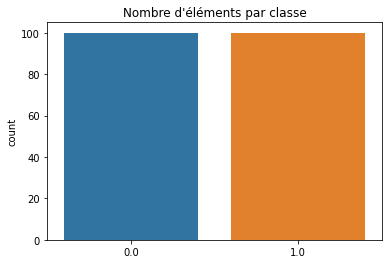

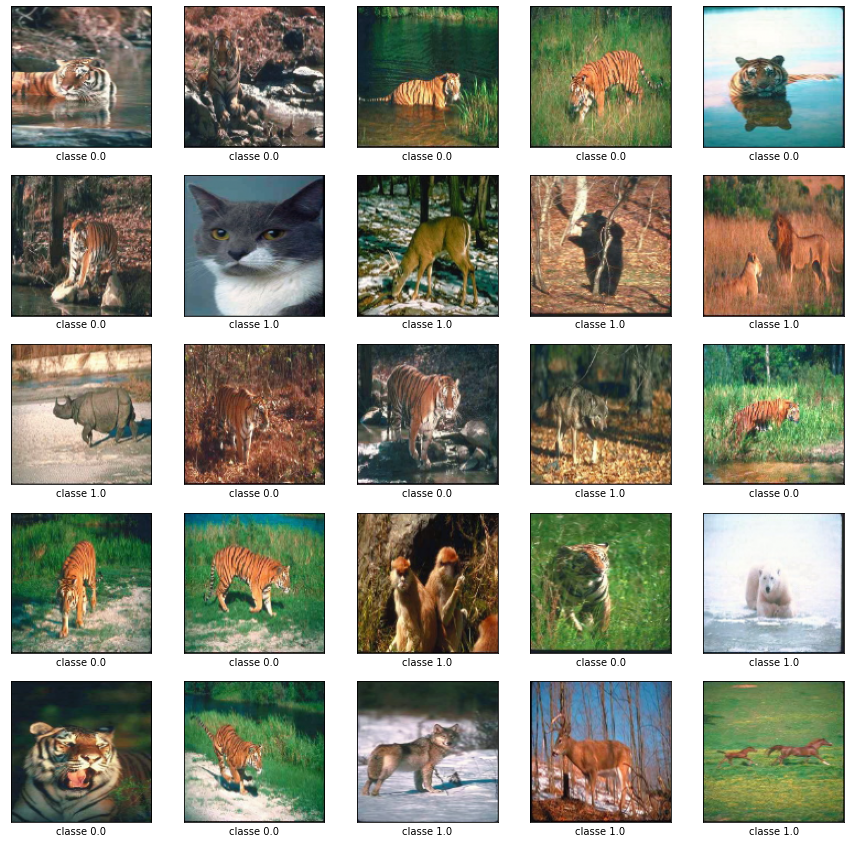

y :  [0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1.
 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1.
 0. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 0. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0.
 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1.
 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0.
 0. 0. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 0.
 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 0. 1.
 0. 0. 0. 0. 0. 1. 1. 1.]
y_val :  [0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 1.
 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
y_train :  [0. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0.
 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1.
 0. 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1

In [38]:
X, y = create_tigre()
print("y : ", y)

X_train, y_train, X_val, y_val = split(X,y)
print("y_val : ", y_val)
print("y_train : ", y_train)

In [39]:
#Optimisation hyperparametre
tuner = kt.Hyperband(Baseline_model_hp, objective = 'val_accuracy', max_epochs = 25,  factor = 3, overwrite=True)

tuner.search(X_train,y_train, epochs=15, steps_per_epoch=20, validation_data = (X_val,y_val), verbose = 1, validation_steps=5, callbacks = [CALLBACKS])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

Trial 30 Complete [00h 00m 12s]
val_accuracy: 0.5166666507720947

Best val_accuracy So Far: 0.5166666507720947
Total elapsed time: 00h 03m 21s


In [40]:
print(f"""The hyperparameter search is complete.
The optimal filter in first Convolutional layer is {best_hps.get('num_filters')}.
The optimal number of units in the first densely-connected layer is {best_hps.get('units')}.
His most optimal activation function is {best_hps.get('dense_activation')}.
The most optimal activation function for the last dense layer is {best_hps.get('dense_activation2')}.
And the optimal learning rate for the optimizer is {best_hps.get('learning_rate')}.""")

The hyperparameter search is complete.
The optimal filter in first Convolutional layer is 64.
The optimal number of units in the first densely-connected layer is 80.
His most optimal activation function is tanh.
The most optimal activation function for the last dense layer is tanh.
And the optimal learning rate for the optimizer is 0.0001.


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 127008)            0         
                                                                 
 dense_1 (Dense)             (None, 85)                10795765  
                                                                 
 dense_2 (Dense)             (None, 1)                 86        
                                                                 
Total params: 10,796,747
Trainable params: 10,796,747
Non-trainable params: 0
__________________________________________

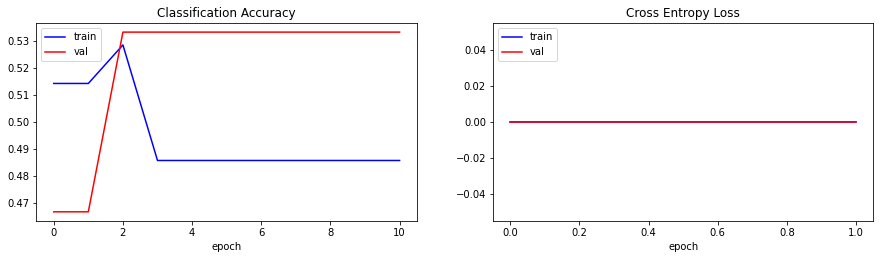

6/6 [==============================] - 0s 5ms/step - loss: nan - accuracy: 0.5333
test loss, test acc :  [nan, 0.5333333611488342]
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 127008)            0         
                                                                 
 dense_1 (Dense)             (None, 85)                10795765  
                                                                 
 dense_2 (Dense)             (None, 1)                 86        
                                                       

In [41]:
modelebaselineTiger = Baseline_model()

history_modelebaselineTiger = modelebaselineTiger.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=5, validation_data=(X_val, y_val), verbose=1)

history_modelebaselineTiger = [history_modelebaselineTiger]
score = []

#Affigage
affichage_plot(history_modelebaselineTiger, score)

#Evaluation du modèle
results_modelebaselineTiger = modelebaselineTiger.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_modelebaselineTiger)
modelebaselineTiger.summary()

Entrainement du baseline model fox

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (128, 128, 3)
Distribution des labels dans le jeu d'apprentissage


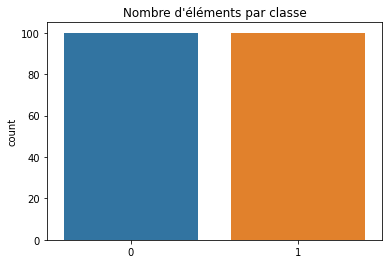

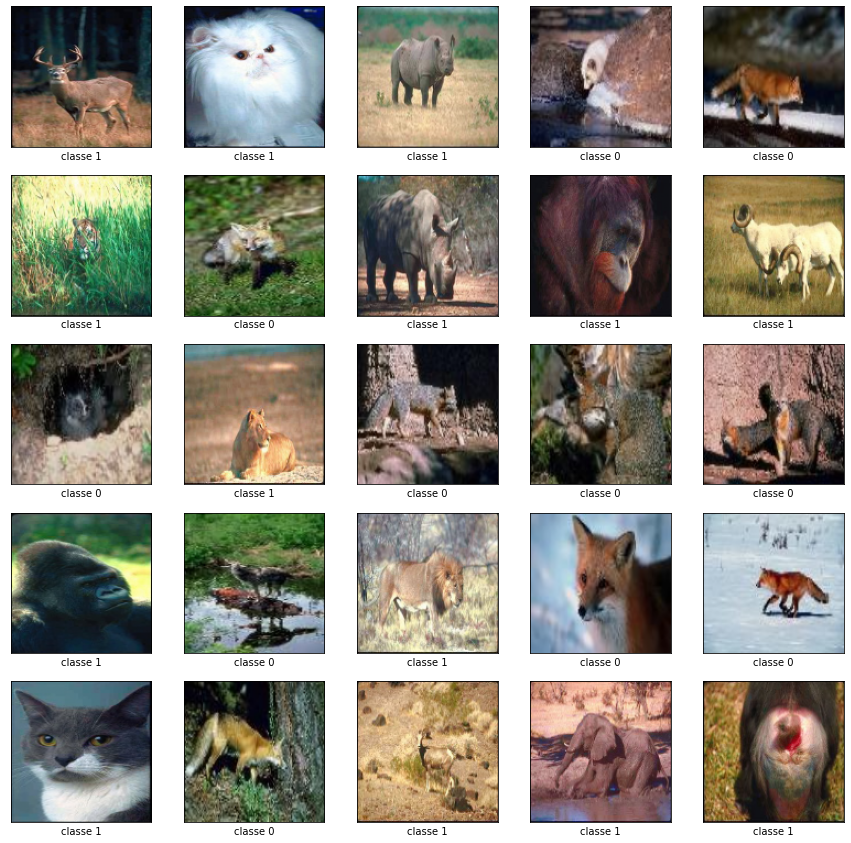

In [42]:
X_fox, y_fox = create_fox()
X_train, y_train, X_val , y_val  = split(X_fox,y_fox)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 127008)            0         
                                                                 
 dense_3 (Dense)             (None, 85)                10795765  
                                                                 
 dense_4 (Dense)             (None, 1)                 86        
                                                                 
Total params: 10,796,747
Trainable params: 10,796,747
Non-trainable params: 0
__________________________________________

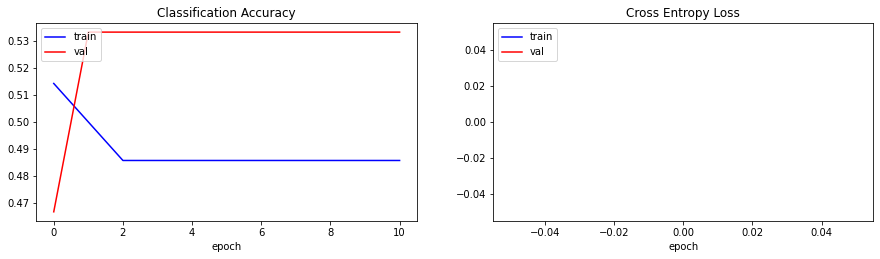

6/6 [==============================] - 0s 6ms/step - loss: nan - accuracy: 0.5333
test loss, test acc :  [nan, 0.5333333611488342]


In [43]:
modelebaselineFox = Baseline_model()
history_modelebaselineFox = modelebaselineFox.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=5, validation_data=(X_val, y_val), verbose=1)

history_modelebaselineFox = [history_modelebaselineFox]
score = []

#Affigage
affichage_plot(history_modelebaselineFox, score)

#Evaluation du modèle
results_modelebaselineFox = modelebaselineFox.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_modelebaselineFox)

Entrainement du baseline model elephant

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (128, 128, 3)
Distribution des labels dans le jeu d'apprentissage
Nombres d'image de classe 0 :  100
Nombres d'image de classe 1 :  100


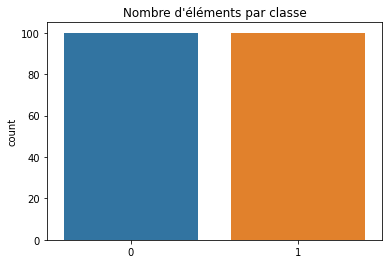

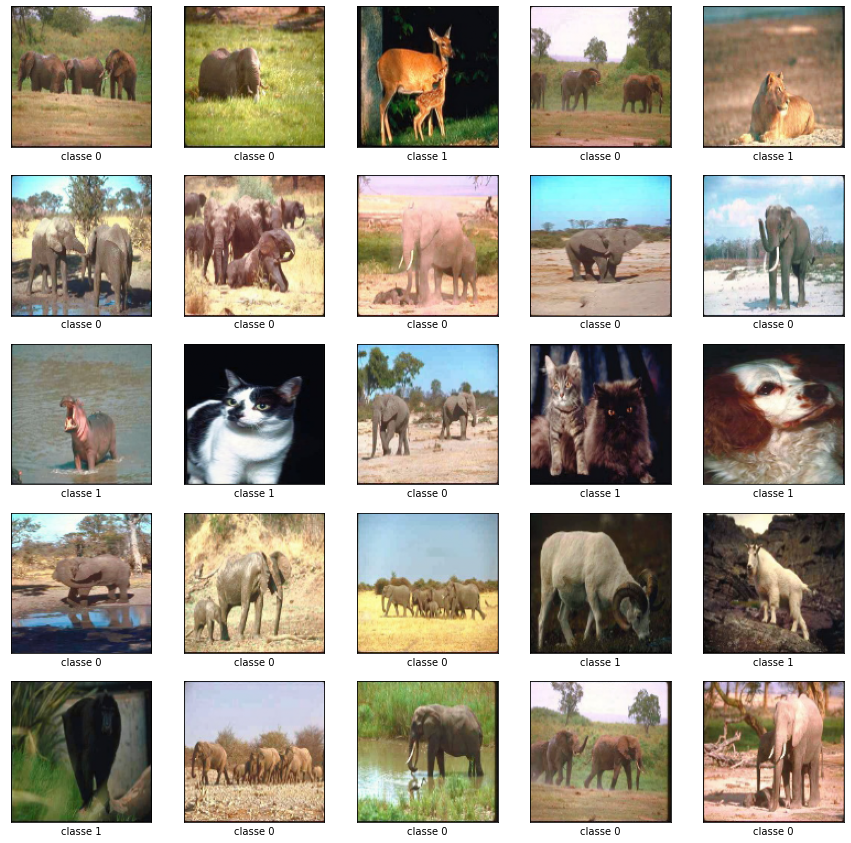

In [44]:
X_Elephant, y_Elephant = create_elephant()
X_train, y_train, X_val, y_val = split(X_Elephant,y_Elephant)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 127008)            0         
                                                                 
 dense_5 (Dense)             (None, 85)                10795765  
                                                                 
 dense_6 (Dense)             (None, 1)                 86        
                                                                 
Total params: 10,796,747
Trainable params: 10,796,747
Non-trainable params: 0
__________________________________________

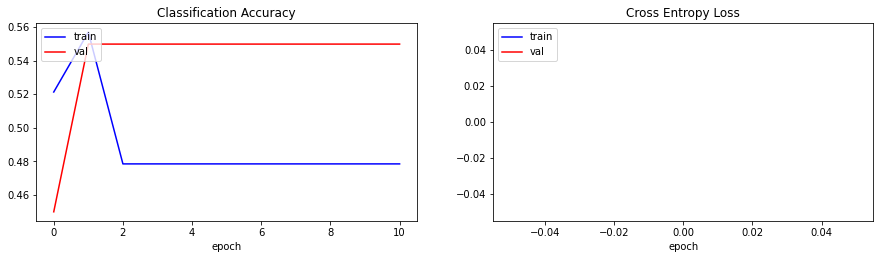

6/6 [==============================] - 0s 6ms/step - loss: nan - accuracy: 0.5500
test loss, test acc :  [nan, 0.550000011920929]


In [45]:
modelebaselineElephant = Baseline_model()
history_modelebaselineElephant = modelebaselineElephant.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=5, validation_data=(X_val, y_val), verbose=1)

history_modelebaselineElephant = [history_modelebaselineElephant]
score = []

#Affigage
affichage_plot(history_modelebaselineElephant, score)

#Evaluation du modèle
results_modelebaselineElephant = modelebaselineElephant.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_modelebaselineElephant)

##Advanced model without data generator

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (128, 128, 3)
Distribution des labels dans le jeu d'apprentissage


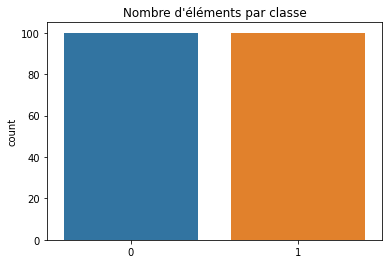

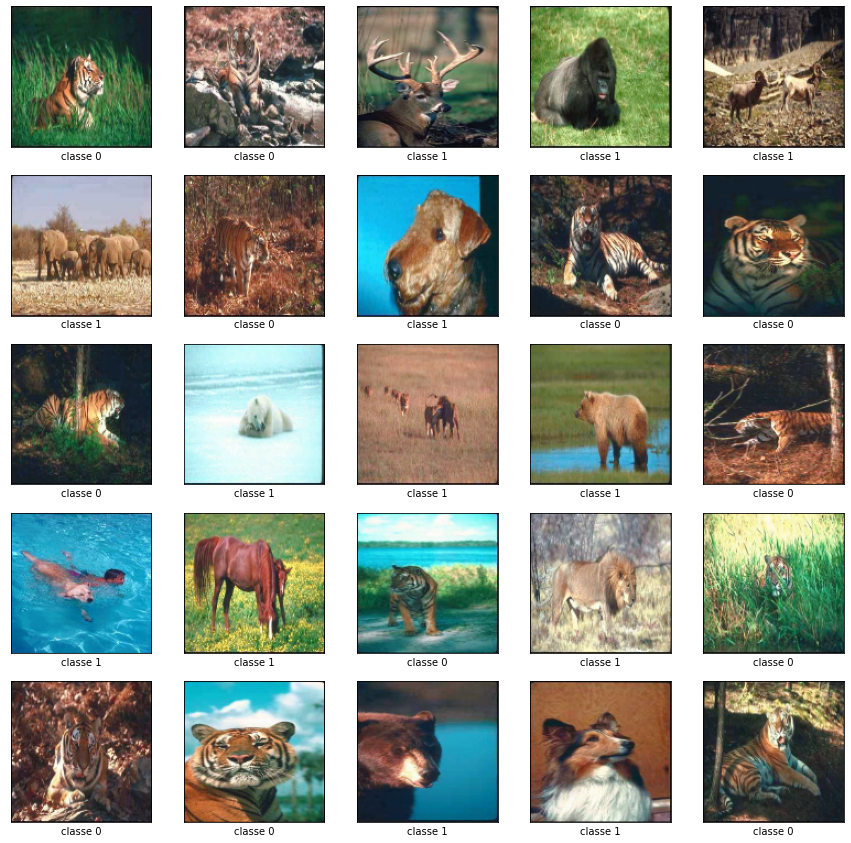

In [46]:
X, y = create_tigre()
X_train, y_train, X_val, y_val = split(X,y)

Détermination des hyperparamètre optimales

In [47]:
import math
batch_size = 5
training_size = len(X_train)
validate_size = len(X_val)
def calculate_spe(y) : 
  return int ( math. ceil (( 1. * y ) / batch_size ))  
steps_per_epoch = calculate_spe(training_size)
validation_steps = calculate_spe(validate_size)

#Optimisation hyperparametre
tuner = kt.Hyperband(Advanced_model_hp, objective = 'val_accuracy', max_epochs = 25,  factor = 3, overwrite=True)

tuner.search(X_train,y_train, epochs=10, batch_size=batch_size, steps_per_epoch=steps_per_epoch, validation_data = (X_val,y_val), verbose = 1, validation_steps=validation_steps)

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

Trial 7 Complete [00h 00m 03s]
val_accuracy: 0.5666666626930237

Best val_accuracy So Far: 0.5833333134651184
Total elapsed time: 00h 00m 27s

Search: Running Trial #8

Value             |Best Value So Far |Hyperparameter
128               |32                |num_filters1
16                |64                |num_filters2
64                |16                |num_filters3
16                |128               |num_filters4
256               |896               |units
relu              |relu              |dense_activation1
tanh              |relu              |dense_activation2
adamax            |SGD               |optimizer
3                 |3                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
2                 |2                 |tuner/bracket
0                 |0                 |tuner/round

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2

KeyboardInterrupt: ignored

In [ ]:
print(f"""The hyperparameter search is complete.
The optimal filter in first Convolutional layer is {best_hps.get('num_filters1')}.
The optimal filter in second Convolutional layer is {best_hps.get('num_filters2')}.
The optimal filter in third Convolutional layer is {best_hps.get('num_filters3')}.
The optimal filter in fourst Convolutional layer is {best_hps.get('num_filters4')}.
The optimal number of units in the first densely-connected layer is {best_hps.get('units')}.
The most optimal activation function is {best_hps.get('dense_activation1')}.
The most optimal activation function is {best_hps.get('dense_activation2')}.
The optimal optimizer is {best_hps.get('optimizer')}.""")

Entrainement de l'advanced model tigre sans K-fold

In [ ]:
X, y = create_tigre()
X_train, y_train, X_val, y_val = split(X,y)

In [ ]:
modeleTiger = Advanced_model()

#Entrainement
history_modeleTiger = modeleTiger.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=3, validation_data=(X_val, y_val), verbose=1)
history_modeleTiger = [history_modeleTiger]
scores = []

#Affigage
affichage_plot(history_modeleTiger, scores)

#Evaluation du model
results_advance = modeleTiger.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_advance)

In [ ]:
list_layer_conv=[0,3,6,9]
#https://www.google.com/url?sa=i&url=https%3A%2F%2Fdevelopersbreach.com%2Fconvolution-neural-network-deep-learning%2F&psig=AOvVaw086osfA13nvY4OJe7rWHa1&ust=1668878973989000&source=images&cd=vfe&ved=0CBAQjRxqFwoTCOCHvOWguPsCFQAAAAAdAAAAABAg
my_image = load_img('/content/gdrive/My Drive/Colab_Notebooks/HAI923/Data_Project/Tiger-Fox-Elephant/tiger/503.jpg', target_size=(128, 128))

#print image
plt.figure()
plt.imshow(my_image)
plt.show()

# Selection des couches correspondant aux convolutions
outputs = [modeleTiger.layers[i].output for i in list_layer_conv]
feature_maps_model = tf.keras.models.Model(inputs=modeleTiger.inputs , outputs=outputs)
my_image = np.expand_dims(my_image, axis=0)
feature_maps=feature_maps_model.predict(my_image)
feature_map_layer1 = tf.keras.models.Model(inputs=modeleTiger.inputs , outputs=modeleTiger.layers[1].output)
layer_names = [layer.name for layer in modeleTiger.layers]
features=feature_map_layer1.predict(my_image)

# Selection des couches correspondant aux convolutions
for i,fmap in zip(list_layer_conv,feature_maps):
    fig = plt.figure(figsize=(16,12))
    fig.suptitle(layer_names[i] , fontsize=20)
    for i in range(1,features.shape[3]+1) :
        plt.subplot(8,8,i)
        plt.imshow(fmap[0,:,:,i-1])
plt.show()

Entrainement de l'advanced model fox sans K-fold

In [ ]:
X_fox, y_fox = create_fox()
X_train, y_train, X_val , y_val  = split(X_fox,y_fox)

modeleFox = Advanced_model()

#Entrainement
history_modeleFox = modeleFox.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=3, validation_data=(X_val, y_val), verbose=1)
history_modeleFox = [history_modeleFox]
scores = []

#Affigage
affichage_plot(history_modeleFox, scores)

#Evaluation du model
results_advance = modeleFox.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_advance)

Entrainement de l'advanced model elephant sans K-fold

In [ ]:
X_Elephant, y_Elephant = create_elephant()
X_train, y_train, X_val, y_val = split(X_Elephant,y_Elephant)

modeleElephant = Advanced_model()

#Entrainement
history_modeleElephant = modeleElephant.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=3, validation_data=(X_val, y_val), verbose=1)
history_modeleElephant = [history_modeleElephant]
scores = []

#Affigage
affichage_plot(history_modeleElephant, scores)

#Evaluation du model
results_advance = modeleElephant.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_advance)

##Advanced model with data generator

Entrainement de l'advanced model tigre avec K_fold et data generator

In [ ]:
X, y = create_tigre()
X_train, y_train, X_val, y_val = split(X,y)

datagen = ImageDataGenerator(
            featurewise_center=True, #
            featurewise_std_normalization=True, #
            rotation_range=10, #
            width_shift_range=0.1, #
            height_shift_range=0.1, #
            shear_range=0.1, #
            zoom_range=0.1, #
            horizontal_flip=True, #
            fill_mode='wrap', #
            validation_split=0.3) #

In [ ]:
modeleIDGTiger = Advanced_model()

datagen_train = datagen.flow(X_train, y_train,batch_size=25)
datagen_val = datagen.flow(X_val, y_val,batch_size=25)
       
datagen.fit(X_train)
# fits the model on batches with real-time data augmentation:
modeleIDGTiger.fit(datagen_train,
         validation_data=datagen_val,
         epochs=EPOCHS, callbacks=CALLBACKS, batch_size=25)

In [ ]:
modeleIDGTiger = Advanced_model()

datagen_train = datagen.flow(X_train, y_train)
datagen_val = datagen.flow(X_val, y_val)
       
datagen.fit(X_train)
# fits the model on batches with real-time data augmentation:
modeleIDGTiger.fit(datagen,
         validation_data=datagen_val,
         epochs=EPOCHS, callbacks=CALLBACKS)

#Evaluation du model
results_advance = modeleIDGTiger.evaluate(datagen.flow(X_val, y_val), batch_size=5)
print("test loss, test acc : ", results_advance)

history_modeleIDGTiger = []
EPOCHS2 = 20
# here's a more "manual" example
for e in range(EPOCHS2):
    print('Epoch', e+1)
    batches = 0
    for x_batch, y_batch in datagen.flow(X_train, y_train, batch_size=32):
        history_modeleIDGTiger = modeleIDGTiger.fit(x_batch, y_batch)
        batches += 1
        if batches >= len(X_train) / 32:
            # we need to break the loop by hand because
            # the generator loops indefinitely
            break

#Evaluation du model
results_advance = modeleIDGTiger.evaluate(X_val, y_val, batch_size=5)
print("test loss, test acc : ", results_advance)

In [ ]:
datagen.fit(X_train)

BS = 25
# train the network
history_modeleIDGTiger = modeleIDGTiger.fit(datagen.flow(X_train, y_train, batch_size=BS),
	validation_data=datagen.flow(X_val, y_val, batch_size=BS), steps_per_epoch=len(X_train) // BS,
	epochs=EPOCHS, callbacks = CALLBACKS)

history_modeleIDGTiger = [history_modeleIDGTiger]
scores = []

#Affigage
affichage_plot(history_modeleIDGTiger, scores)

#Evaluation du model
results_advance = modeleIDGTiger.evaluate(X_val, y_val, batch_size=32)
print("test loss, test acc : ", results_advance)

In [ ]:
batch_size = 32
train_generator = datagen.flow(X_train, y_train, batch_size=batch_size)
valid_generator = datagen.flow(X_train, y_train, batch_size=batch_size)
test_generator = datagen.flow((X_val,y_val), batch_size=1)

history_modeleIDGTiger = modeleIDGTiger.fit(train_generator, validation_data=test_generator,
 steps_per_epoch=len(X_train) // batch_size,
 epochs=5)

history_modeleIDGTiger = [history_modeleIDGTiger]
scores = []

#Affigage
affichage_plot(history_modeleIDGTiger, scores)

#Evaluation du model
results_advance = modeleIDGTiger.evaluate(X_val, y_val, batch_size=32)
print("test loss, test acc : ", results_advance)

Generation of data

In [ ]:
generatedData()

In [ ]:
X, y = create_tigre()
X_train, y_train, X_val, y_val = split(X,y)

modeleIDGTiger = Advanced_model()

#Entrainement
history_modeleIDGTiger = modeleIDGTiger.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=25, validation_data=(X_val, y_val), verbose=1)
history_modeleIDGTiger = [history_modeleIDGTiger]
scores = []

#Affigage
affichage_plot(history_modeleIDGTiger, scores)

#Evaluation du model
results_advance = modeleIDGTiger.evaluate(X_val, y_val, batch_size=32)
print("test loss, test acc : ", results_advance)

Entrainement de l'advanced model tigre avec K_fold n°2

In [ ]:
#Entrainement K-fold 2
scores, history_advance, k_range, scores = evaluate_model_Kfold2(modeleIDGTiger, X_train, y_train, X_val, y_val, 10)

In [ ]:
#Affigage
affichage_plot(history_advance, scores)

Entrainement de l'advanced model fox sans K_fold et data generator

In [ ]:
X_fox, y_fox = create_fox()
X_train, y_train, X_val , y_val  = split(X_fox,y_fox)

modeleIDGFox = Advanced_model()

#Entrainement
history_modeleIDGFox = modeleIDGFox.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=32, validation_data=(X_val, y_val), verbose=1)
history_modeleIDGFox = [history_modeleIDGFox]
scores = []

#Affigage
affichage_plot(history_modeleIDGFox, scores)

#Evaluation du model
results_advance = modeleIDGFox.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_advance)

Entrainement de l'advanced model elephant sans K_fold et data generator

In [ ]:
X_Elephant, y_Elephant = create_elephant()
X_train, y_train, X_val , y_val = split(X_Elephant,y_Elephant)

modeleIDGElephant = Advanced_model()

#Entrainement
history_modeleIDGElephant= modeleIDGElephant.fit(X_train, y_train, epochs=EPOCHS, callbacks=CALLBACKS, batch_size=32, validation_data=(X_val, y_val), verbose=1)
history_modeleIDGElephant = [history_modeleIDGElephant]
scores = []

#Affigage
affichage_plot(history_modeleIDGElephant, scores)

#Evaluation du model
results_advance = modeleIDGElephant.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_advance)

##Transfert learning

Le transfer learning ou apprentissage par transfert consiste à compléter l'apprentissage d'un modèle au préalable entraîné à résoudre une tâche donnée, en vue de lui permettre de résoudre une tâche similaire, généralement plus précise.

In [ ]:
X, y = create_tigre()
X_train, y_train, X_val, y_val = split(X,y)

Détermination des hyperparamètre optimales

In [ ]:
#Optimisation hyperparametre
tuner = kt.Hyperband(TLmodel_hp, objective = 'val_accuracy', max_epochs = 25,  factor = 5, directory = '/.M', project_name = 'hyper_tuning7')

tuner.search(X_train,y_train, epochs=10, steps_per_epoch=20, validation_data = (X_val,y_val), verbose = 1, validation_steps=5, callbacks = [CALLBACKS])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

In [ ]:
print(f"""The hyperparameter search is complete. 
The optimal activation function for first dense layer is {best_hps.get('dense_activation')}.
The optimal number of units in the first densely-connected layer is {best_hps.get('units')}.
The optimal rate of dropout is {best_hps.get('dropout_1')}.
The optimal rate of activation function for last dense layer is {best_hps.get('dense_activation2')}.
And the optimal learning rate for the optimizer is {best_hps.get('learning_rate')}.""")

Entrainement du TL model tigre

In [ ]:
X, y = create_tigre()
X_train, y_train, X_val, y_val = split(X,y)

In [ ]:
modeleTLTiger = TLmodel3()

#Entrainement
history = modeleTLTiger.fit(X_train, y_train, epochs=50, callbacks=CALLBACKS, batch_size=20, steps_per_epoch=len(X_train)//20, validation_data=(X_val, y_val))
afficheTL(history)
#batches = steps_per_epoch * epochs
#Evaluation
results_resnet_model = modeleTLTiger.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_resnet_model)

Entrainement du TL model fox

In [ ]:
X_fox, y_fox = create_fox()
X_train, y_train, X_val , y_val  = split(X_fox,y_fox)

modeleTLFox = TLmodel3()

#Entrainement
history = modeleTLFox.fit(X_train, y_train, epochs=50, callbacks=CALLBACKS, batch_size=25, steps_per_epoch=len(X_train)//20, validation_data=(X_val, y_val))
afficheTL(history)

#Evaluation
results_resnet_model = modeleTLFox.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_resnet_model)

Entrainement du TL model elephant

In [ ]:
X_Elephant, y_Elephant = create_elephant()
X_train, y_train, X_val , y_val  = split(X_Elephant,y_Elephant)

modeleTLElephant = TLmodel3()

#Entrainement
history = modeleTLElephant.fit(X_train, y_train, epochs=50, callbacks=CALLBACKS, batch_size=25, steps_per_epoch=len(X_train)//20, validation_data=(X_val, y_val))
afficheTL(history)

#Evaluation
results_resnet_model = modeleTLElephant.evaluate(X_val, y_val, batch_size=10)
print("test loss, test acc : ", results_resnet_model)

##GAN

In [50]:
latent_dim=100
epochs=500
batchsize=32
# Creation du discriminateur
discriminator_model = create_discriminator()
# Creation du generateur
generator_model = create_generator(latent_dim)
# Creation du GAN
gan_model = create_gan(generator_model, discriminator_model)
# Chargement des données
dataset = load_data('elephant')
#best 3dis 4gen

epoche n° 0
1/1 [==============================] - 0s 14ms/step
epoche n° 1
1/1 [==============================] - 0s 14ms/step
epoche n° 2
1/1 [==============================] - 0s 15ms/step
epoche n° 3
1/1 [==============================] - 0s 15ms/step
epoche n° 4
1/1 [==============================] - 0s 14ms/step
epoche n° 5
1/1 [==============================] - 0s 14ms/step
epoche n° 6
1/1 [==============================] - 0s 19ms/step
epoche n° 7
1/1 [==============================] - 0s 15ms/step
epoche n° 8
1/1 [==============================] - 0s 15ms/step
epoche n° 9
1/1 [==============================] - 0s 16ms/step
epoche n° 10
1/1 [==============================] - 0s 18ms/step
epoche n° 11
1/1 [==============================] - 0s 17ms/step
epoche n° 12
1/1 [==============================] - 0s 17ms/step
epoche n° 13
1/1 [==============================] - 0s 14ms/step
epoche n° 14
1/1 [==============================] - 0s 14ms/step
epoche n° 15
1/1 [=================

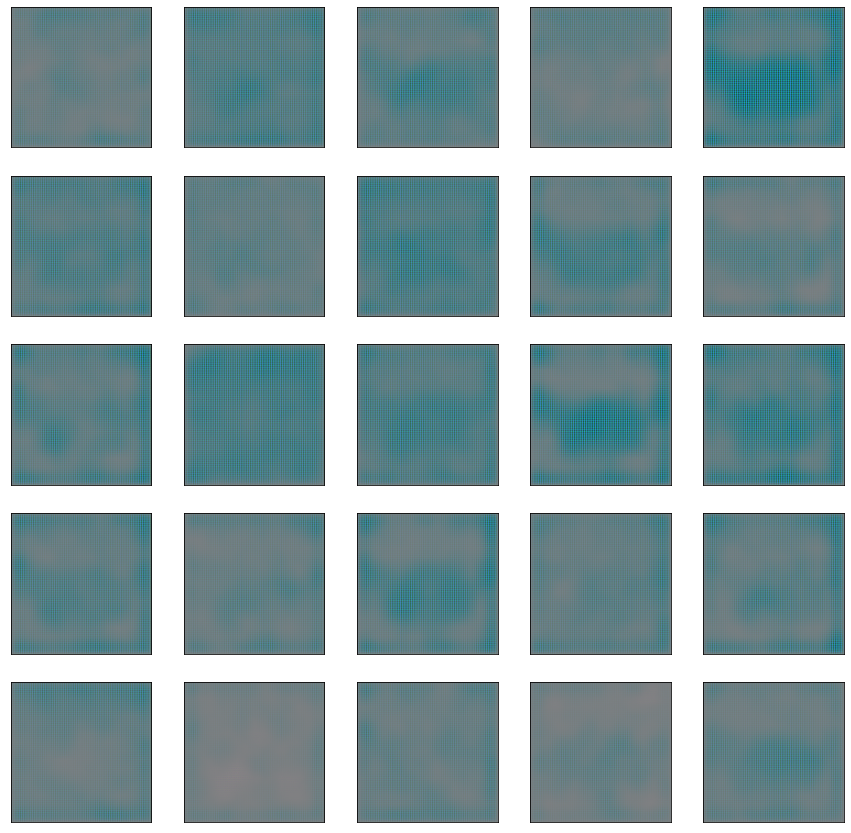

epoche n° 21
1/1 [==============================] - 0s 19ms/step
epoche n° 22
1/1 [==============================] - 0s 15ms/step
epoche n° 23
1/1 [==============================] - 0s 15ms/step
epoche n° 24
1/1 [==============================] - 0s 14ms/step
epoche n° 25
1/1 [==============================] - 0s 14ms/step
epoche n° 26
1/1 [==============================] - 0s 14ms/step
epoche n° 27
1/1 [==============================] - 0s 16ms/step
epoche n° 28
1/1 [==============================] - 0s 15ms/step
epoche n° 29
1/1 [==============================] - 0s 17ms/step
epoche n° 30
1/1 [==============================] - 0s 15ms/step
epoche n° 31
1/1 [==============================] - 0s 17ms/step
epoche n° 32
1/1 [==============================] - 0s 15ms/step
epoche n° 33
1/1 [==============================] - 0s 14ms/step
epoche n° 34
1/1 [==============================] - 0s 15ms/step
epoche n° 35
1/1 [==============================] - 0s 15ms/step
epoche n° 36
1/1 [=======

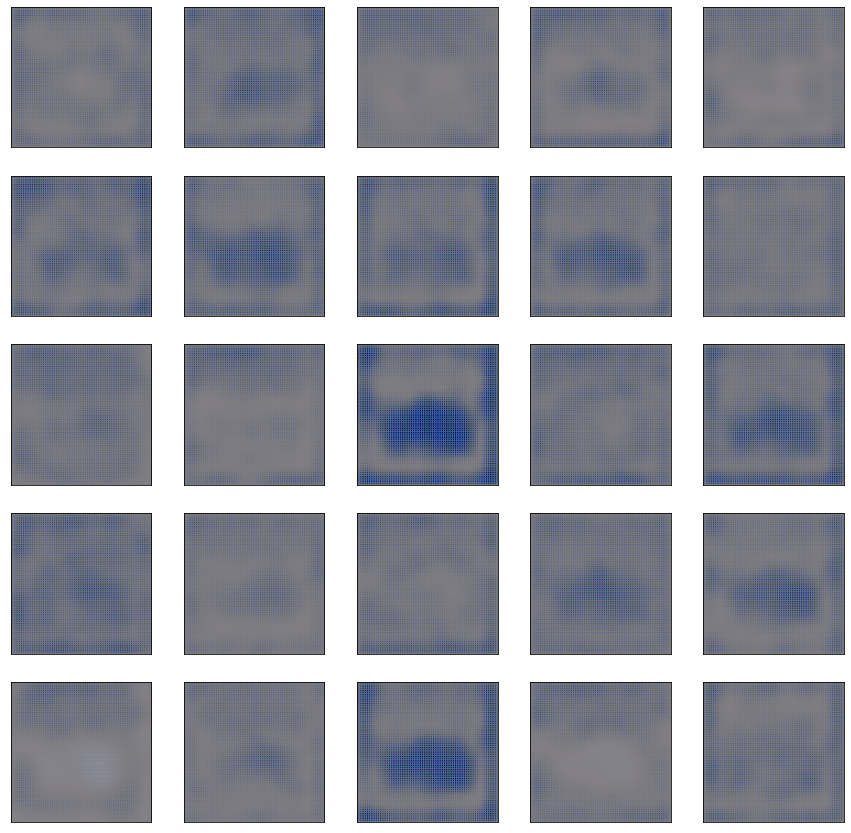

epoche n° 41
1/1 [==============================] - 0s 15ms/step
epoche n° 42
1/1 [==============================] - 0s 15ms/step
epoche n° 43
1/1 [==============================] - 0s 14ms/step
epoche n° 44
1/1 [==============================] - 0s 15ms/step
epoche n° 45
1/1 [==============================] - 0s 14ms/step
epoche n° 46
1/1 [==============================] - 0s 14ms/step
epoche n° 47
1/1 [==============================] - 0s 15ms/step
epoche n° 48
1/1 [==============================] - 0s 15ms/step
epoche n° 49
1/1 [==============================] - 0s 15ms/step
epoche n° 50
1/1 [==============================] - 0s 14ms/step
epoche n° 51
1/1 [==============================] - 0s 14ms/step
epoche n° 52
1/1 [==============================] - 0s 14ms/step
epoche n° 53
1/1 [==============================] - 0s 14ms/step
epoche n° 54
1/1 [==============================] - 0s 15ms/step
epoche n° 55
1/1 [==============================] - 0s 33ms/step
epoche n° 56
1/1 [=======

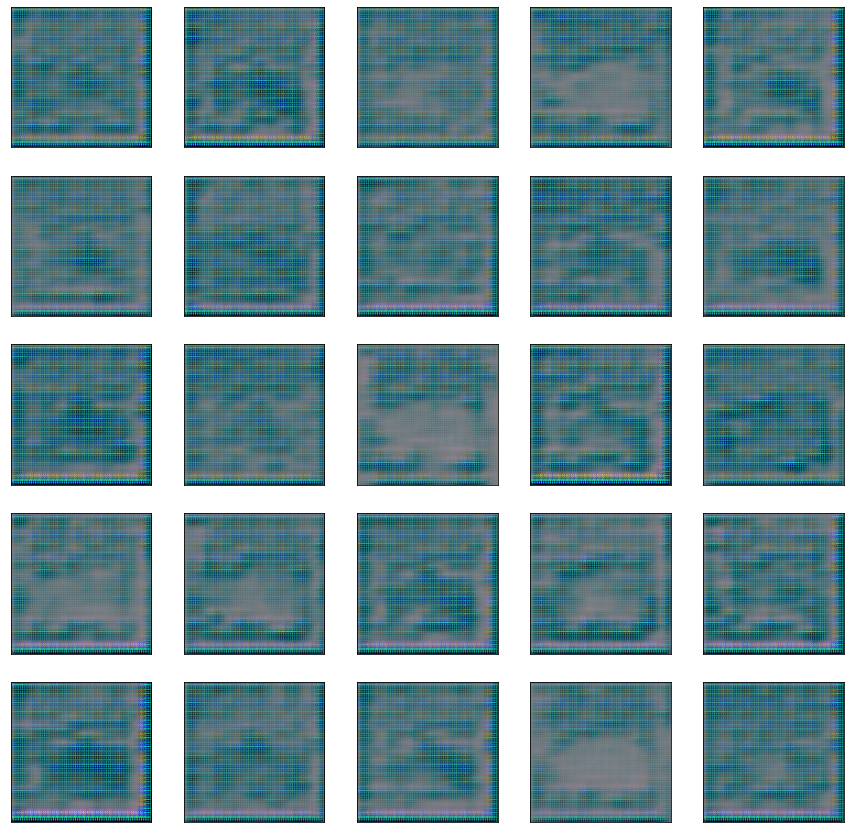

epoche n° 61
1/1 [==============================] - 0s 18ms/step
epoche n° 62
1/1 [==============================] - 0s 24ms/step
epoche n° 63
1/1 [==============================] - 0s 21ms/step
epoche n° 64
1/1 [==============================] - 0s 19ms/step
epoche n° 65
1/1 [==============================] - 0s 26ms/step
epoche n° 66
1/1 [==============================] - 0s 15ms/step
epoche n° 67
1/1 [==============================] - 0s 15ms/step
epoche n° 68
1/1 [==============================] - 0s 23ms/step
epoche n° 69
1/1 [==============================] - 0s 15ms/step
epoche n° 70
1/1 [==============================] - 0s 15ms/step
epoche n° 71
1/1 [==============================] - 0s 16ms/step
epoche n° 72
1/1 [==============================] - 0s 14ms/step
epoche n° 73
1/1 [==============================] - 0s 14ms/step
epoche n° 74
1/1 [==============================] - 0s 15ms/step
epoche n° 75
1/1 [==============================] - 0s 15ms/step
epoche n° 76
1/1 [=======

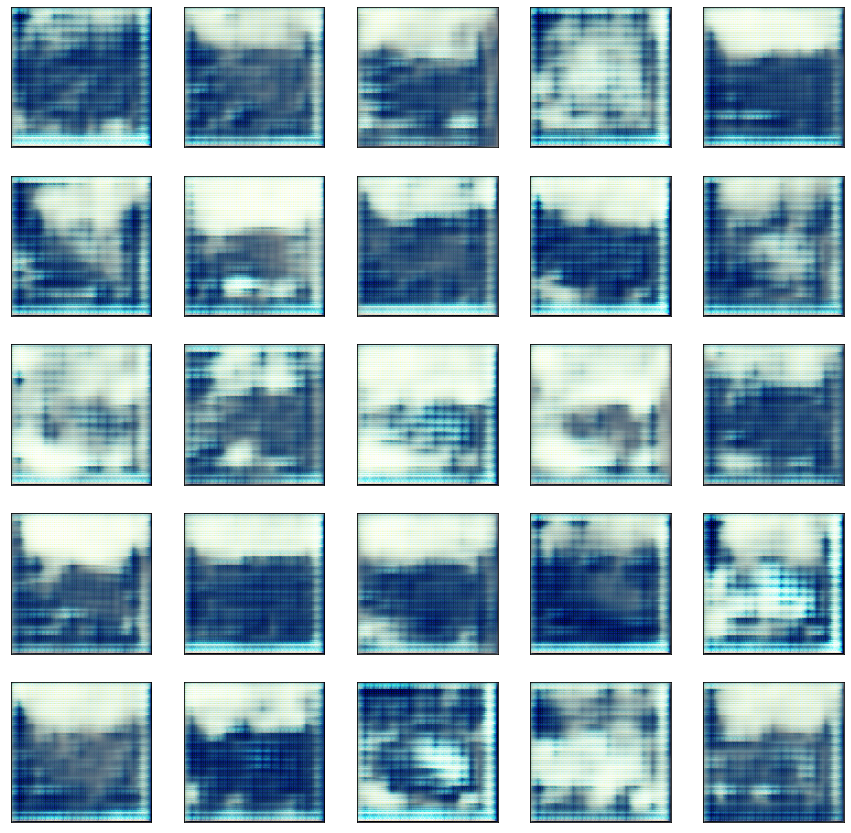

epoche n° 81
1/1 [==============================] - 0s 15ms/step
epoche n° 82
1/1 [==============================] - 0s 17ms/step
epoche n° 83
1/1 [==============================] - 0s 14ms/step
epoche n° 84
1/1 [==============================] - 0s 17ms/step
epoche n° 85
1/1 [==============================] - 0s 14ms/step
epoche n° 86
1/1 [==============================] - 0s 14ms/step
epoche n° 87
1/1 [==============================] - 0s 14ms/step
epoche n° 88
1/1 [==============================] - 0s 17ms/step
epoche n° 89
1/1 [==============================] - 0s 15ms/step
epoche n° 90
1/1 [==============================] - 0s 15ms/step
epoche n° 91
1/1 [==============================] - 0s 15ms/step
epoche n° 92
1/1 [==============================] - 0s 14ms/step
epoche n° 93
1/1 [==============================] - 0s 16ms/step
epoche n° 94
1/1 [==============================] - 0s 15ms/step
epoche n° 95
1/1 [==============================] - 0s 15ms/step
epoche n° 96
1/1 [=======

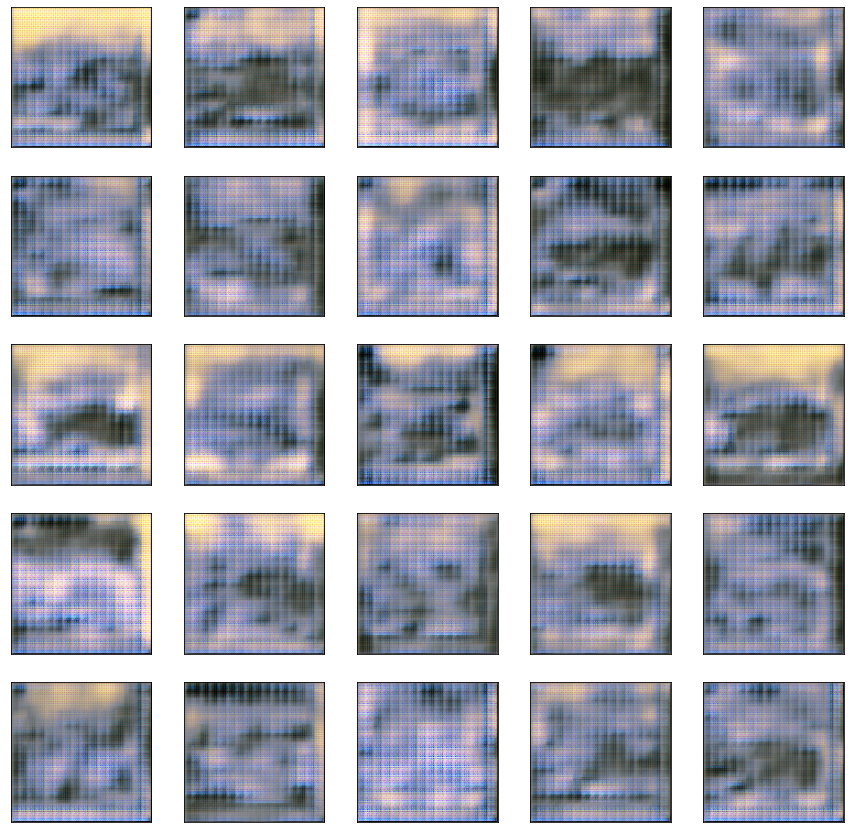

epoche n° 101
1/1 [==============================] - 0s 21ms/step
epoche n° 102
1/1 [==============================] - 0s 15ms/step
epoche n° 103
1/1 [==============================] - 0s 14ms/step
epoche n° 104


KeyboardInterrupt: ignored

In [51]:
# train model
train(generator_model, discriminator_model, gan_model, dataset, latent_dim, epochs, batchsize)

In [ ]:
latent_dim=100
epochs=150
batchsize=32
# Creation du discriminateur
discriminator_model = create_discriminator4()
# Creation du generateur
generator_model = create_generator4(latent_dim)
# Creation du GAN
gan_model = create_gan(generator_model, discriminator_model)
# Chargement des données
dataset = load_data('elephant')

In [ ]:
# train model
train(generator_model, discriminator_model, gan_model, dataset, latent_dim, epochs, batchsize)

In [ ]:
evaluate_model(dataset, 1, generator_model, discriminator_model, latent_dim)

In [ ]:
#sauvegarde de 10 images générer par le GAN
latent_dim=100
generated_images = []
for i in range(10) :
  noise=tf.random.normal([1,latent_dim])
  image = (generator_model.predict(noise)[0]+1)/2
  generated_images.append(image)

In [ ]:
COLUMNS = 10 # Nombre d'images à afficher
#affichage des images générer
plt.figure(figsize=(15,15))
for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    # il faut donc convertir pour afficher les bonnes couleurs
    generated_images[i] = cv2.cvtColor(generated_images[i], cv2.COLOR_BGR2RGB)
    plt.imshow(generated_images[i],cmap=plt.cm.binary)  
    plt.xlabel('taille ' + str(generated_images[i].shape))
plt.show()

In [ ]:
#Prédiction des images générer par le GAN sur le model avancée
for i in range(10) :
  input_arr = generated_images[i]
  predictions = modeleIDGElephant.predict(input_arr.reshape()....)
print(f"L'image n°{i+1} est prédite comme étant un : ")
if (predictions == 0) :
  print("un autre animal.")
else :
  print("un éléphant.")

##Autoencodeur

In [ ]:
def createEncoder(input_shape):
  model = Sequential()
  # 1 couche  de convolution avec nombre de filtres progressif 128
  model.add(Conv2D(filters=128, kernel_size=(3,3), input_shape=input_shape, padding='same', activation='relu'))
  # 1/2 taille
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # 2 couche  de convolution avec nombre de filtres progressif 64
  model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
  # 1/4 taille
  model.add(MaxPooling2D(pool_size=(2, 2)))

  model.add(Conv2D(filters=3, kernel_size=(3,3), padding='same', activation='tanh'))
  return model

In [ ]:
encoder = createEncoder((128,128,3))
encoder.summary()

In [ ]:
def createDecoder(input_shape):
  model = Sequential()

  # upsample to 2x
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), input_shape=input_shape, padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  # upsample to 4x
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), input_shape=(input_shape), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2D(filters=3, kernel_size=(3,3), padding='same', activation='tanh'))
  return model

In [ ]:
decoder = createDecoder(encoder.output[0].shape)
decoder.summary()

In [ ]:
def createAutoEncoder(en, de):
  model=Sequential()
  # ajout de l'encoder
  model.add(en)
  # ajout du decoder
  model.add(de)

  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [ ]:
autoEncoder = createAutoEncoder(encoder, decoder)
autoEncoder.summary()

In [ ]:
X = load_data('elephant')
X=X.astype('float')
X=X/255.0
X_train, X_val= train_test_split(X, test_size=0.2, random_state=1)

In [ ]:
autoEncoder.fit(X_train, X_train, epochs=100, batch_size=20, validation_data=(X_val, X_val))

In [ ]:
#X = load_data('elephant')
imgE = encoder.predict(X)
imgD = decoder.predict(imgE)

In [ ]:
ind = 0
plt.imshow(X[ind]*225)

In [ ]:
plt.imshow(imgE[ind]*255)

In [ ]:
plt.imshow(imgD[ind]*255)